In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.colors import ListedColormap
from IPython.display import HTML
import networkx as nx

# Metropolis Monte-Carlo implementation of Ising model

In our implementation, we use the Metropolis Monte-Carlo (MC) method to update a given spin system. In the cell below, the parent class MetropolisIsing contains the methods for updating a spin system, as well as methods for calculating the net magnetization and net energy (which are helpful quantities to plot in order to visualize phase transitions.) The calculation of nearest-neighbor spin alignments is left for child classes to implement in order to account for the geometries specific to each system of interest.

In [23]:
# General metropolis algorithm for Ising model.
class MetropolisIsing:
    """ 
    Implementation of generic Ising model, i.e. binary spin configurations with 
    nearest-neighbor (nn) interactions, using a vectorized Metropolis 
    Monte-Carlo (MC) algorithm. By convention, +1 indicates spin up, -1 indicates 
    spin down, and the magnetic field is applied in the up direction.
    """
    def __init__(self, T, J=1.0, H=0.0):
        """
        Args:
            T (float): temperature
            J (float): strength of nearest neighbor interactions
            H (float): strength of external magnetic field
        """
        self.beta = 1 / T   # Set Boltzmann constant to 1.
        self.J = J
        self.H = H
    
    def nn_alignment(self):
        """ 
        Must be implemented in child classes.
        Intended to return net alignment of the nearest-neighbor (nn) spins, 
        using periodic boundary conditions.
        """
        raise NotImplementedError("Method must be called from a child class.")
    
    def update_spins(self, X_spins):
        """ 
        Update spins in the lattice using metropolis algorithm.
        Args:
            X_spins (1d or 2d array): current state of the spin system
        
        Returns:
            X_result (1d or 2d array): updated state of the spin system
        """
        # Calculate change in energy required to flip each spin.
        X_nn = self.nn_alignment(X_spins)
        X_Ei = - self.J * X_spins * X_nn - self.H * X_spins
        X_Ef = - X_Ei
        X_deltaE = X_Ef - X_Ei

        X_result = X_spins.copy()
        X_flip = - X_spins

        # If deltaE < 0, accept the spin flip.
        X_result[X_deltaE < 0] = X_flip[X_deltaE < 0]

        # If deltaE > 0, accept the spin flip with probability
        # given by Boltzmann factor.
        X_prob = np.random.rand(*X_spins.shape)
        X_prob_c = np.exp(- self.beta * X_deltaE)
        X_result[(X_deltaE > 0) & (X_prob < X_prob_c)] = X_flip[
            (X_deltaE > 0) & (X_prob < X_prob_c)]

        return X_result
    
    def net_magnetization(self, X_spins):
        """ 
        Calculate net magnetization of the spin system. This is simply the sum
        of all spin values in the lattice.
        Args:
            X_spins (1d or 2d array): current state of the spin system
        
        Returns:
            (float): net magnetization
        """
        return np.sum(X_spins)
    
    def net_energy(self, X_spins):
        """ 
        Calculate net energy of the spin lattice. This is the sum of all energies
        due to nn interactions and the external magnetic field.
        Args:
            X_spins (1d or 2d array): current state of the spin system
        
        Returns:
            (float): net energy
        """
        X_nn = self.nn_alignment(X_spins)
        X_E = - self.J * X_spins * X_nn - self.H * X_spins
        return np.sum(X_E) / 2


---

# Ising model on 1D chain

The 1D Ising Model consists of a chain of spins, each with 2 nearest neighbors. The 1D model does not exhibit a phase transition and is easily solvable analytically. This MC implementation serves as simply a stepping stone to the 2D model, which we analyze in more detail.

The IsingID class below implements the nn_alignment method to calculate the net alignment of the 2 nearest neighbors per spin. The method uses a vectorized approach and periodic boundary conditions to maximize nearest-neighbor interactions.

In [24]:
class Ising1D(MetropolisIsing):
    """ 
    Metropolis MC implementation of Ising model on 1d spin chain.
    """
    def nn_alignment(self, X_chain):
        """ 
        Sum the spin values of the 2 nearest neighbors (nn) for each spin in
        the lattice. This represents the net alignment of the nn spins.
        Args:
            X_chain (1darray): current state of the spin system

        Returns:
            X_nn (1darray): sum of nn spin values
        """
        X_nn = np.zeros_like(X_chain)
        X_nn[:-1] += X_chain[1:]           # Left neighbor contribution
        X_nn[1:]  += X_chain[:-1]          # Right neighbor contribution

        # Periodic boundary conditions.
        X_nn[-1] += X_chain[0]
        X_nn[0] += X_chain[-1]

        return X_nn

The next two cells below simulates the time evolution of the 1D Ising chain. This is done by starting with a random initial state and repeatedly updating the system with the Ising1D class above. As the temperature increases, entropy overcomes the nearest-neighbor interactions, and the spin orientations become randomized.

iterations: 8


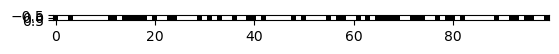

In [16]:
# Simulate time evolution of a 1D Ising model with nn interactions.
# Start with a random state with 75% spins down.
Ising1d = Ising1D(T=0.1, J=1, H=0.1)
np.random.seed(0)
frames = []
dim = 100
chain1d = np.random.choice([-1, 1], size=dim)
array1d = chain1d.reshape(1, -1)
frames.append(array1d)
fig = plt.figure()
img = plt.imshow(array1d, cmap="gray")

for i in range(50):
    chain1d = Ising1d.update_spins(chain1d)
    array1d = chain1d.reshape(1, -1)
    frames.append(array1d)
    if np.all(chain1d == 1):
        break
print("iterations:", i + 1)

def animate(frame):
    img.set_array(frame)

animation = FuncAnimation(fig, animate, frames=frames, interval=len(frames))
HTML(animation.to_jshtml())

No external field (H = 0).


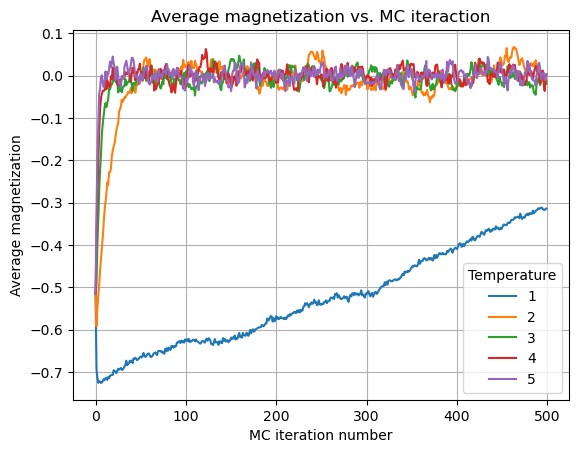

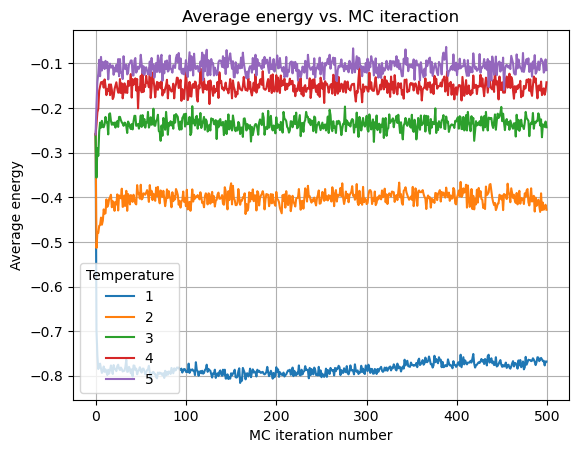

In [20]:
# Plot average values vs MC iteration for various temperatures, with 0 external field.
# Start with a random state with 75% spins down.
temps = np.arange(1, 6, 1)
total_iter = 500
all_iter = []
all_mag, all_energies = [], []
dim = 5000
chain1d = np.random.choice([-1, 1], size=dim, p=[0.75, 0.25])

for temp in temps:
    Ising_chain = Ising1D(T=temp, J=1, H=0.0)
    np.random.seed(0)
    iteration = np.arange(0, total_iter)
    avg_mag, avg_energy = [], []

    prev = chain1d
    for i in range(total_iter):
        current = Ising_chain.update_spins(prev)
        avg_mag.append(Ising_chain.net_magnetization(prev) / dim)
        avg_energy.append(Ising_chain.net_energy(prev) / dim)
        prev = current

    all_iter.append(iteration)
    all_mag.append(avg_mag)
    all_energies.append(avg_energy)

print("No external field (H = 0).")
plt.figure(0)
for i in range(len(all_iter)):
    temp = temps[i]
    plt.plot(all_iter[i], all_mag[i], label=str(temp))

plt.xlabel('MC iteration number')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. MC iteraction')
plt.grid()
plt.legend(title="Temperature")
plt.show()

plt.figure(1)
for i in range(len(all_iter)):
    temp = temps[i]
    plt.plot(all_iter[i], all_energies[i], label=str(temp))

plt.xlabel('MC iteration number')
plt.ylabel('Average energy')
plt.title('Average energy vs. MC iteraction')
plt.grid()
plt.legend(title="Temperature")
plt.show()

The next cell plots the average magnetization, energy, and heat capacity of the Ising chain as functions of temperature. The values of magnetization, energy, and heat capacity are recorded after the system reaches "equilibrium" (i.e. after a large number of MC iterations), and averaged over multiple trials to reduce statistical fluctuations. The plots are smooth functions of temperature (except for some jumps at low temperature), which is characterstic of a system without a phase transition.

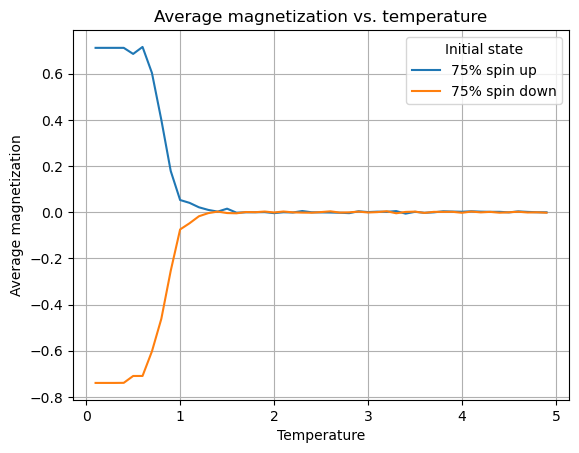

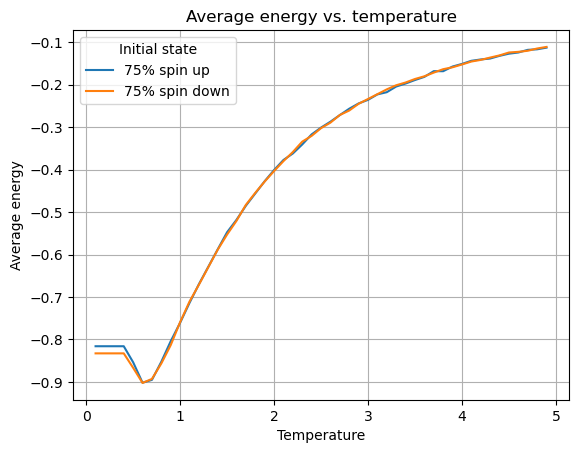

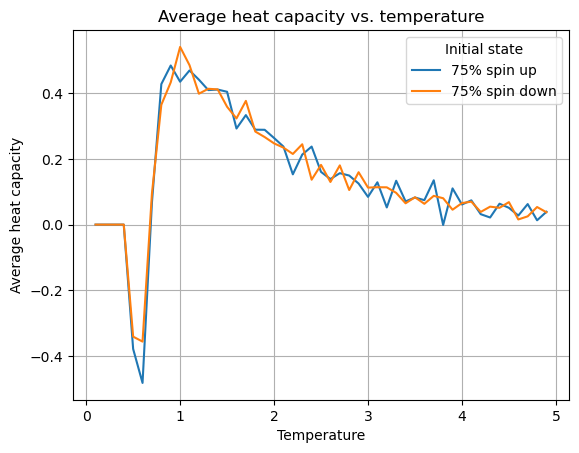

In [18]:
# Plot equilibrium average values as a function of temperature, with 0 external field.
# Start with random state with 75% spins up/down.
delta_temp = 0.1
temps = np.arange(0.1, 5., delta_temp)
total_iter = 100
trials = 50
l_mag_d, l_energy_d, l_heat_cap_d = [], [], []
l_mag_u, l_energy_u, l_heat_cap_u = [], [], []
dim = 5000

np.random.seed(0)
chain_down = np.random.choice([-1, 1], size=dim, p=[0.75, 0.25])
chain_up = np.random.choice([-1, 1], size=dim, p=[0.25, 0.75])

for temp in temps:
    Ising_chain = Ising1D(T=temp, J=1, H=0.0)
    prev_d = chain_down
    prev_u = chain_up
    
    trial_energy_d, trial_mag_d = [], []
    trial_energy_u, trial_mag_u = [], []
    for t in range(trials):     # Multiple trials to average out statistical fluctuations.
        for i in range(total_iter):
            current_d = Ising_chain.update_spins(prev_d)
            current_u = Ising_chain.update_spins(prev_u)
            if np.array_equal(current_d, prev_d) \
                and np.array_equal(current_u, prev_u):
                break
            prev_d = current_d
            prev_u = current_u

        trial_energy_d.append(Ising_chain.net_energy(prev_d) / dim)
        trial_mag_d.append(Ising_chain.net_magnetization(prev_d) / dim)
        trial_energy_u.append(Ising_chain.net_energy(prev_u) / dim)
        trial_mag_u.append(Ising_chain.net_magnetization(prev_u) / dim)

    avg_mag_d = sum(trial_mag_d) / trials
    avg_energy_d = sum(trial_energy_d) / trials
    if not l_energy_d:
        heat_cap_d = 0
    else:
        heat_cap_d = (avg_energy_d - l_energy_d[-1]) / delta_temp
    l_mag_d.append(avg_mag_d)
    l_energy_d.append(avg_energy_d)
    l_heat_cap_d.append(heat_cap_d)

    avg_mag_u = sum(trial_mag_u) / trials
    avg_energy_u = sum(trial_energy_u) / trials
    if not l_energy_u:
        heat_cap_u = 0
    else:
        heat_cap_u = (avg_energy_u - l_energy_u[-1]) / delta_temp
    l_mag_u.append(avg_mag_u)
    l_energy_u.append(avg_energy_u)
    l_heat_cap_u.append(heat_cap_u)


plt.figure(0)
plt.plot(temps, l_mag_u, label="75% spin up")
plt.plot(temps, l_mag_d, label="75% spin down")
plt.xlabel('Temperature')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. temperature')
plt.grid()
plt.legend(title="Initial state")
plt.show()

plt.figure(1)
plt.plot(temps, l_energy_u, label="75% spin up")
plt.plot(temps, l_energy_d, label="75% spin down")
plt.xlabel('Temperature')
plt.ylabel('Average energy')
plt.title('Average energy vs. temperature')
plt.grid()
plt.legend(title="Initial state")
plt.show()

plt.figure(2)
plt.plot(temps, l_heat_cap_u, label="75% spin up")
plt.plot(temps, l_heat_cap_d, label="75% spin down")
plt.xlabel('Temperature')
plt.ylabel('Average heat capacity')
plt.title('Average heat capacity vs. temperature')
plt.grid()
plt.legend(title="Initial state")
plt.show()

The last cell plots the functions of average magnetization, energy, and heat capcity for different values of the external magnetic field $H$. The average magnetization and energy plots are smooth functions of temperature (although the plots at low $H$ exhibit very steep slopes) due to the absence of a phase transition. The average heat capacity plots exhibit peaks that might be suggestive of a phase transition, but this is due to finite-system and statistical effects in our MC implementation.

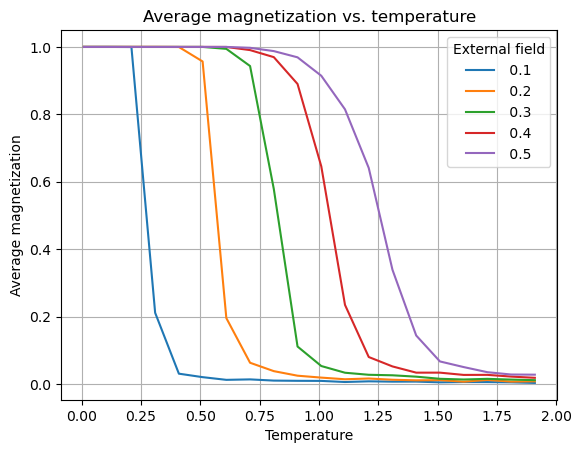

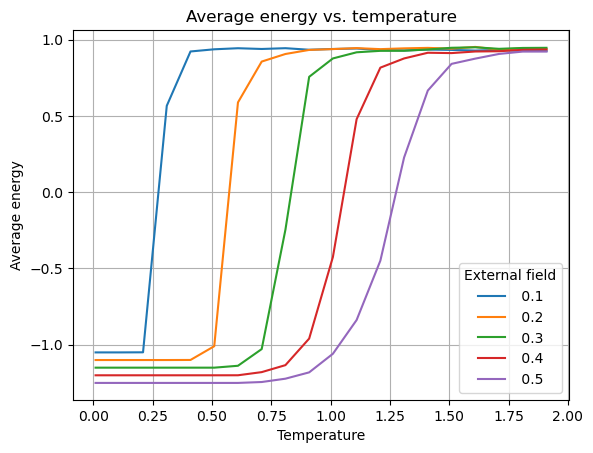

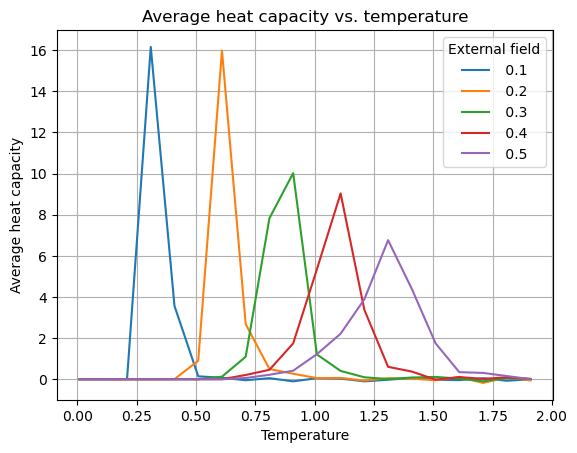

In [22]:
# Plot equilibrium average values as a function of temperature for various 
# external field strengths.
# Start with random state with 75% spins down.
ext_field = np.arange(0.1, 0.6, 0.1)
delta_temp = 0.1
temps = np.arange(0.01, 2., delta_temp)
total_iter = 100
trials = 10
l_all_mag, l_all_energy, l_all_heat_cap = [], [], []
dim = 2500

for field_val in ext_field:
    np.random.seed(0)
    chain1d = np.random.choice([-1, 1], size=dim, p=[0.75, 0.25])
    l_mag, l_energy, l_heat_cap = [], [], []

    for temp in temps:
        Ising_chain = Ising1D(T=temp, J=1, H=field_val)
        prev = chain1d
        trial_energy, trial_mag = [], []
        for t in range(trials):     # Multiple trials to average out statistical fluctuations.
            for i in range(total_iter):
                current = Ising_chain.update_spins(prev)
                if np.array_equal(current, prev):
                    break
                prev = current
            trial_energy.append(Ising_chain.net_energy(current) / dim)
            trial_mag.append(Ising_chain.net_magnetization(current) / dim)

        avg_mag = sum(trial_mag) / trials
        avg_energy = sum(trial_energy) / trials
        if not l_energy:
            heat_cap = 0
        else:
            heat_cap = (avg_energy - l_energy[-1]) / delta_temp
        l_mag.append(avg_mag)
        l_energy.append(avg_energy)
        l_heat_cap.append(heat_cap)

    l_all_mag.append(l_mag)
    l_all_energy.append(l_energy)
    l_all_heat_cap.append(l_heat_cap)

plt.figure(0)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_mag[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

plt.figure(1)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_energy[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average energy')
plt.title('Average energy vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

plt.figure(2)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_heat_cap[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average heat capacity')
plt.title('Average heat capacity vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()


---
# Ising model on 2D lattice

Generically, the 2D Ising model consists of a square lattice or grid of spins, each with 4 nearest neighbors. At the Curie temperature, the system transitions from ferromagnetic to paramagnetic. The class Ising2DLattice shown below implements the nn_alignment method analgously to the 1D class, only with more neighbors. As before, the method uses a vectorized approach and periodic boundary conditions.

In [25]:
class Ising2DLattice(MetropolisIsing):
    """ 
    Metropolis MC implementation of Ising model on a 2D lattice.
    """
    def nn_alignment(self, X_lattice):
        """ 
        Sum the spin values of the 4 nearest neighbors (nn) for each spin in
        the lattice. This represents the net alignment of the nn spins.
        Args:
            X_lattice (2d array): current state of the spin system

        Returns:
            X_nn (2d array): sum of nn spin values
        """
        X_nn = np.zeros_like(X_lattice)
        X_nn[:, :-1] += X_lattice[:, 1:]    # Left nn contribution
        X_nn[:, 1:] += X_lattice[:, :-1]    # Right nn contribution
        X_nn[:-1, :] += X_lattice[1:, :]    # Lower nn contribution
        X_nn[1:, :] += X_lattice[:-1, :]    # Upper nn contribution

        # Periodic boundary conditions
        X_nn[:, 0] += X_lattice[:, -1]      # Right-end to left-end
        X_nn[:, -1] += X_lattice[:, 0]      # Left-end to right-end
        X_nn[0, :] += X_lattice[-1, :]      # Bottom-end to top-end
        X_nn[-1, :] += X_lattice[-1, :]     # Top-end to bottom-end

        return X_nn


The cell below simulates the time evolution of the 2D Ising model on a generic square lattice. The ferromagnetic phase can be seen at low $T$, at which applying a small external field $H$ causes all (or almost all) spins to align with the field. The paramagnetic phase can be seen at high $T$, at which the spins continue flipping randomly without collective aligning in a single direction.

iterations: 78


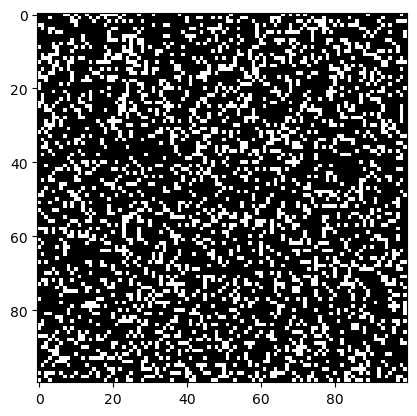

In [ ]:
# Simulate time evolution of a 2D Ising model with nn interactions.
# Start with a random state with 75% spins down.
Ising2d = Ising2DLattice(T=0.1, J=1, H=0.1)
np.random.seed(0)

frames = []
dim = 100
lattice2d = np.random.choice([-1, 1], size=(dim, dim), p=[0.75, 0.25])
frames.append(lattice2d)
fig = plt.figure()
img = plt.imshow(lattice2d, cmap="gray")

iterations = 200
prev = lattice2d
for i in range(iterations):
    current = Ising2d.update_spins(prev)
    frames.append(current)
    if np.array_equal(current, prev):
        break
    prev = current
print("iterations:", i + 1)

# Animate the simulation.
def animate(frame):
    img.set_array(frame)

animation = FuncAnimation(fig, animate, frames=frames, interval=len(frames))
HTML(animation.to_jshtml())

The cell below simulates the time evolution of the generic 2D Ising lattice at different temperatures and with no external magnetic field. At low temperatures, the ferromagnetic property of the spin system can be seen as the spins tend to align with each other. At high temperatures, entropy dominates, and the spins become randomized.

No external field (H = 0).


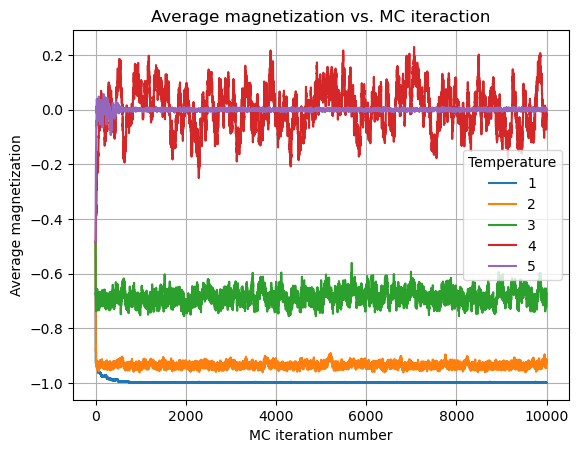

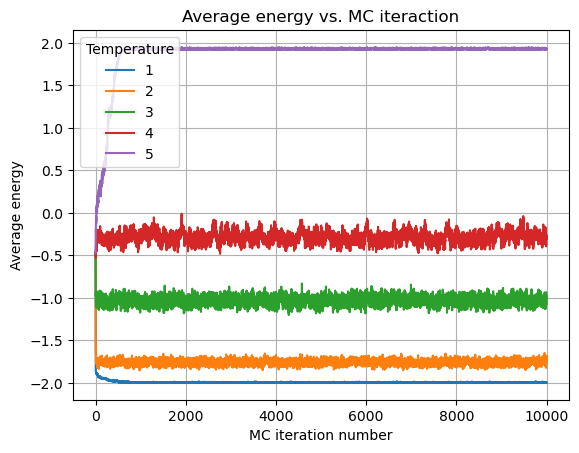

In [5]:
# Plot average values vs MC iteration for various temperatures, with 0 external field.
# Start with a random state with 75% spins down.
temps = np.arange(1, 6, 1)
total_iter = 10000
all_iter = []
all_mag, all_energies = [], []
dim = 50
lattice2d = np.random.choice([-1, 1], size=(dim, dim), p=[0.75, 0.25])
# lattice2d = - np.ones((dim,dim))

for temp in temps:
    Ising2d = Ising2DLattice(T=temp, J=1, H=0.0)
    np.random.seed(0)
    iteration = np.arange(0, total_iter)
    avg_mag, avg_energy = [], []

    prev = lattice2d
    for i in range(total_iter):
        current = Ising2d.update_spins(prev)
        avg_mag.append(Ising2d.net_magnetization(prev) / (dim ** 2))
        avg_energy.append(Ising2d.net_energy(prev) / (dim ** 2))
        prev = current

    all_iter.append(iteration)
    all_mag.append(avg_mag)
    all_energies.append(avg_energy)

print("No external field (H = 0).")
plt.figure(0)
for i in range(len(all_iter)):
    temp = temps[i]
    plt.plot(all_iter[i], all_mag[i], label=str(temp))

plt.xlabel('MC iteration number')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. MC iteraction')
plt.grid()
plt.legend(title="Temperature")
plt.show()

plt.figure(1)
for i in range(len(all_iter)):
    temp = temps[i]
    plt.plot(all_iter[i], all_energies[i], label=str(temp))

plt.xlabel('MC iteration number')
plt.ylabel('Average energy')
plt.title('Average energy vs. MC iteraction')
plt.grid()
plt.legend(title="Temperature")
plt.show()

The cell below plots the average magnetization, energy, and heat capacity of the system at equilibrium as functions of temperature. The Curie temperature can be seen where the average magnetization sharply drops to 0, the average energy jumps from below to above 0, and the average heat capacity forms a sharp peak.

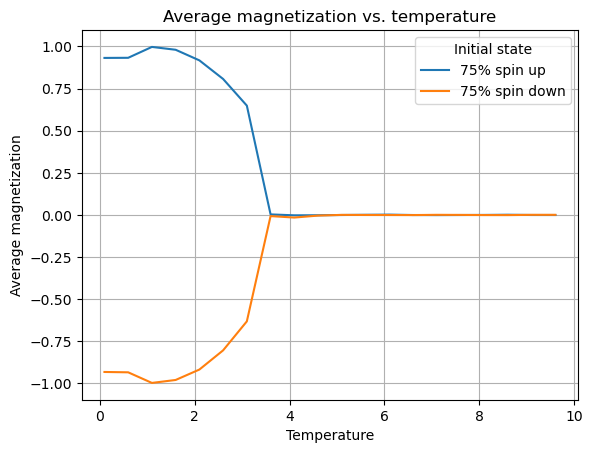

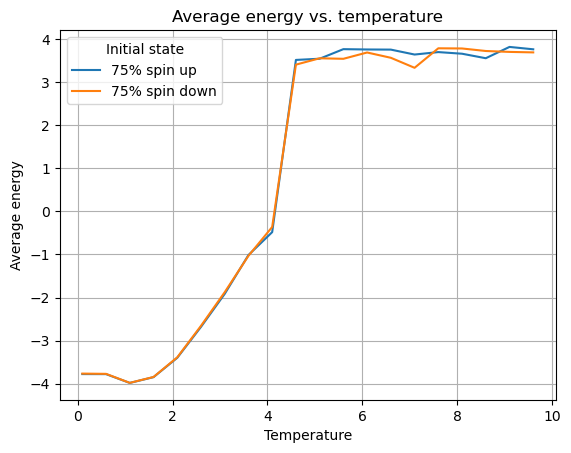

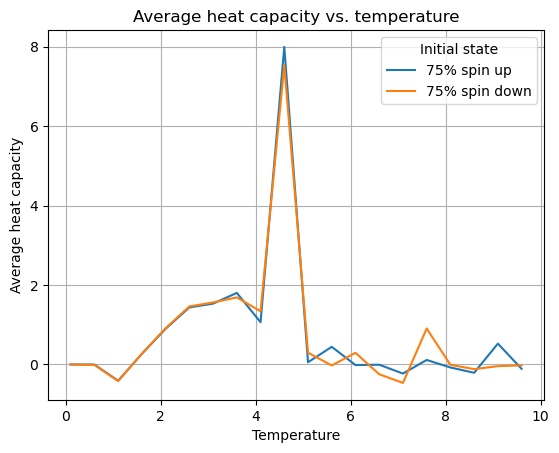

In [221]:
# Plot equilibrium average values as a function of temperature, with 0 external field.
# Start with random state with 75% spins up/down.
delta_temp = 0.5
temps = np.arange(0.1, 10., delta_temp)
total_iter = 100
trials = 50
l_mag_d, l_energy_d, l_heat_cap_d = [], [], []
l_mag_u, l_energy_u, l_heat_cap_u = [], [], []
dim = 50

np.random.seed(0)
lattice_down = np.random.choice([-1, 1], size=(dim, dim), p=[0.75, 0.25])
lattice_up = np.random.choice([-1, 1], size=(dim, dim), p=[0.25, 0.75])

for temp in temps:
    Ising2d = Ising2DLattice(T=temp, J=1, H=0.0)
    prev_d = lattice_down
    prev_u = lattice_up
    
    trial_energy_d, trial_mag_d = [], []
    trial_energy_u, trial_mag_u = [], []
    for t in range(trials):     # Multiple trials to average out statistical fluctuations.
        for i in range(total_iter):
            current_d = Ising2d.update_spins(prev_d)
            current_u = Ising2d.update_spins(prev_u)
            if np.array_equal(current_d, prev_d) \
                and np.array_equal(current_u, prev_u):
                break
            prev_d = current_d
            prev_u = current_u

        trial_energy_d.append(Ising2d.net_energy(prev_d) / dim ** 2)
        trial_mag_d.append(Ising2d.net_magnetization(prev_d) / dim ** 2)
        trial_energy_u.append(Ising2d.net_energy(prev_u) / dim ** 2)
        trial_mag_u.append(Ising2d.net_magnetization(prev_u) / dim ** 2)

    avg_mag_d = sum(trial_mag_d) / trials
    avg_energy_d = sum(trial_energy_d) / trials
    if not l_energy_d:
        heat_cap_d = 0
    else:
        heat_cap_d = (avg_energy_d - l_energy_d[-1]) / delta_temp
    l_mag_d.append(avg_mag_d)
    l_energy_d.append(avg_energy_d)
    l_heat_cap_d.append(heat_cap_d)

    avg_mag_u = sum(trial_mag_u) / trials
    avg_energy_u = sum(trial_energy_u) / trials
    if not l_energy_u:
        heat_cap_u = 0
    else:
        heat_cap_u = (avg_energy_u - l_energy_u[-1]) / delta_temp
    l_mag_u.append(avg_mag_u)
    l_energy_u.append(avg_energy_u)
    l_heat_cap_u.append(heat_cap_u)


plt.figure(0)
plt.plot(temps, l_mag_u, label="75% spin up")
plt.plot(temps, l_mag_d, label="75% spin down")
plt.xlabel('Temperature')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. temperature')
plt.grid()
plt.legend(title="Initial state")
plt.show()

plt.figure(1)
plt.plot(temps, l_energy_u, label="75% spin up")
plt.plot(temps, l_energy_d, label="75% spin down")
plt.xlabel('Temperature')
plt.ylabel('Average energy')
plt.title('Average energy vs. temperature')
plt.grid()
plt.legend(title="Initial state")
plt.show()

plt.figure(2)
plt.plot(temps, l_heat_cap_u, label="75% spin up")
plt.plot(temps, l_heat_cap_d, label="75% spin down")
plt.xlabel('Temperature')
plt.ylabel('Average heat capacity')
plt.title('Average heat capacity vs. temperature')
plt.grid()
plt.legend(title="Initial state")
plt.show()

The last cell below plots the functions of average magnetization, energy, and heat capacity at equilibrium for different values of the external field strength $H$. As $H$ increases, the Curie temperature also increases by strengthening the tendency of the spins for align with the external field.

C:\Users\ktcy2\AppData\Local\Temp\ipykernel_1704\4285446572.py:51: RuntimeWarning: overflow encountered in exp
  X_prob_c = np.exp(- self.beta * X_deltaE)


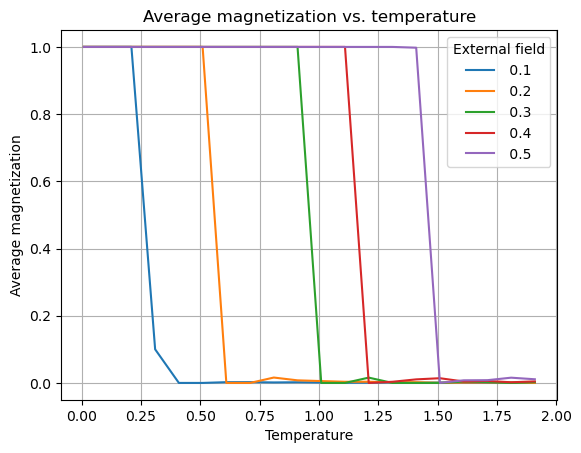

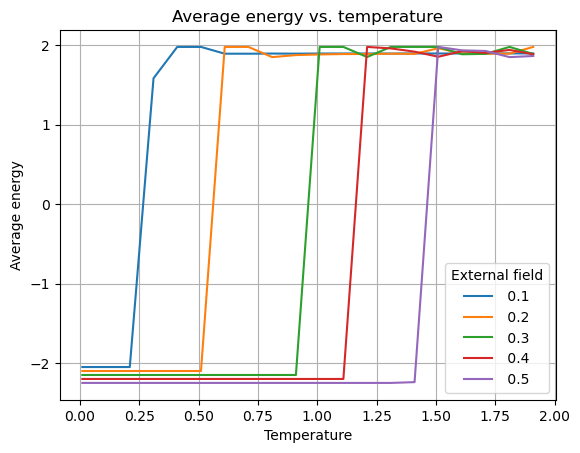

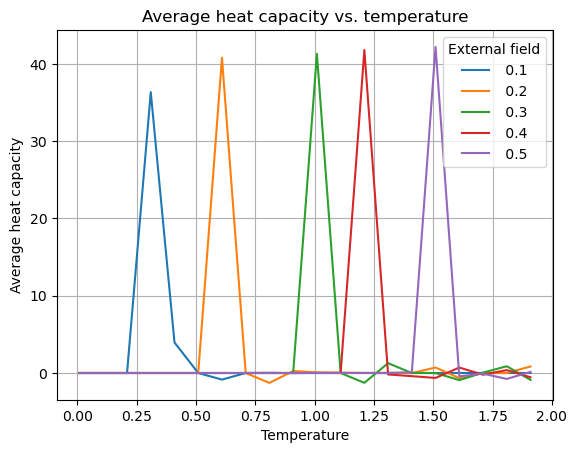

In [24]:
# Plot equilibrium average values as a function of temperature for various 
# external field strengths.
# Start with random state with 75% spins down.
ext_field = np.arange(0.1, 0.6, 0.1)
delta_temp = 0.1
temps = np.arange(0.01, 2., delta_temp)
total_iter = 5000
trials = 10
l_all_mag, l_all_energy, l_all_heat_cap = [], [], []
dim = 50

for field_val in ext_field:
    np.random.seed(0)
    lattice2d = np.random.choice([-1, 1], size=(dim, dim), p=[0.75, 0.25])
    l_mag, l_energy, l_heat_cap = [], [], []

    for temp in temps:
        Ising2d = Ising2DLattice(T=temp, J=1, H=field_val)
        prev = lattice2d
        trial_energy, trial_mag = [], []
        for t in range(trials):     # Multiple trials to average out statistical fluctuations.
            for i in range(total_iter):
                current = Ising2d.update_spins(prev)
                if np.array_equal(current, prev):
                    break
                prev = current
            trial_energy.append(Ising2d.net_energy(prev) / dim ** 2)
            trial_mag.append(Ising2d.net_magnetization(prev) / dim ** 2)
        
        avg_mag = sum(trial_mag) / trials
        avg_energy = sum(trial_energy) / trials
        if not l_energy:
            heat_cap = 0
        else:
            heat_cap = (avg_energy - l_energy[-1]) / delta_temp
        l_mag.append(avg_mag)
        l_energy.append(avg_energy)
        l_heat_cap.append(heat_cap)
        
    l_all_mag.append(l_mag)
    l_all_energy.append(l_energy)
    l_all_heat_cap.append(l_heat_cap)

plt.figure(0)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_mag[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

plt.figure(1)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_energy[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average energy')
plt.title('Average energy vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

plt.figure(2)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_heat_cap[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average heat capacity')
plt.title('Average heat capacity vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

---
# Ising Model with Next-Nearest Neighbor Interactions

Now that we have established a generic 2D Ising model using the metropolis algorithm, we wanted to expand our implementation to test a couple different interaction types and geometries. The first we implemented is Next-Nearest Neighbor (NNN) Interactions, which allows the top-left, top-right, bottom-right, and bottom-left neighbor to interact with a spin. During this implementation, next-nearest neighbor interactions were added to the nearest neighbor interactions present in the 2D square lattice Ising model.

Because there is now another interaction term, frustration can occur when trying to update spins. Frustration is when there are competing interactions that prevent a system from minimizing its energy.

In [26]:
class IsingNonLocal(Ising2DLattice):
    """ 
    Metropolis MC implementation of Ising model on a 2D lattice with local and non-local interactions.
    """
    def __init__(self, T, J=1, H=0, J2=1):
        super().__init__(T, J, H)
        self.J2 = J2 # interaction strength of next nearest neighbors
    
    def nnn_alignment(self, X_lattice):
        """ 
        Sum the spin values of the 4 next-nearest neighbors (nnn) for each spin in
        the lattice. This represents the net alignment of the nnn spins.
        Args:
            X_lattice (2d array): current state of the spin system

        Returns:
            X_nnn (2d array): sum of nnn spin values
        """
        X_nnn = (
            np.roll(X_lattice, shift=(1, 1), axis=(0, 1)) +   # Top-right neighbor
            np.roll(X_lattice, shift=(1, -1), axis=(0, 1)) +  # Top-left neighbor
            np.roll(X_lattice, shift=(-1, 1), axis=(0, 1)) +  # Bottom-right neighbor
            np.roll(X_lattice, shift=(-1, -1), axis=(0, 1))   # Bottom-left neighbor
        )

        return X_nnn
    
    def update_spins(self, X_spins):
        """ 
        Update spins in the lattice using metropolis algorithm.
        Args:
            X_spins (1d or 2d array): current state of the spin system

        Returns:
            X_result (1d or 2d array): updated state of the spin system
        """
        # Calculate change in energy required to flip each spin.
        X_nn = self.nn_alignment(X_spins)
        X_nnn = self.nnn_alignment(X_spins)
        X_Ei = - self.J * X_spins * X_nn - self.J2 * X_spins * X_nnn - self.H * X_spins
        X_Ef = - X_Ei
        X_deltaE = X_Ef - X_Ei

        X_result = X_spins.copy()
        X_flip = - X_spins

        # If deltaE < 0, accept the spin flip.
        X_result[X_deltaE < 0] = X_flip[X_deltaE < 0]

        # If deltaE > 0, accept the spin flip with probability
        # given by Boltzmann factor.
        X_prob = np.random.rand(*X_spins.shape)
        X_prob_c = np.exp(- self.beta * X_deltaE)
        X_result[(X_deltaE > 0) & (X_prob < X_prob_c)] = X_flip[
            (X_deltaE > 0) & (X_prob < X_prob_c)]

        return X_result

    def net_energy(self, X_spins):
        """ 
        Calculate net energy of the spin lattice. This is the sum of all energies
        due to nn interactions and the external magnetic field.
        Args:
            X_spins (1d or 2d array): current state of the spin system

        Returns:
            (float): net energy
        """
        X_nn = self.nn_alignment(X_spins)
        X_nnn = self.nnn_alignment(X_spins)
        X_E = - self.J * X_spins * X_nn - self.J2 * X_spins * X_nnn - self.H * X_spins
        return np.sum(X_E) / 2

Below applies the next-nearest neighbors interactions and demonstrates frustration that can occur.

iterations: 200


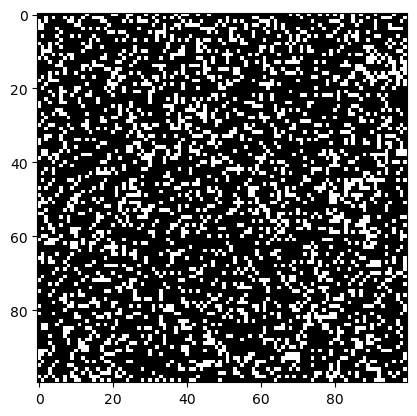

In [16]:
# Simulate time evolution of a 2D Ising model with nn and nnn interactions.
# Start with a random state with 75% spins down.
IsingNNN = IsingNonLocal(T=0.1, J=1, H=0.1, J2=2.0)
np.random.seed(1)

frames = []
dim = 100
lattice2d = np.random.choice([-1, 1], size=(dim, dim), p=[0.75, 0.25])
frames.append(lattice2d)
fig = plt.figure()
img = plt.imshow(lattice2d, cmap="gray")

iterations = 200
prev = lattice2d
for i in range(iterations):
    current = IsingNNN.update_spins(prev)
    frames.append(current)
    if np.array_equal(current, prev):
        break
    prev = current
print("iterations:", i + 1)

# Animate the simulation.
def animate(frame):
    img.set_array(frame)

animation = FuncAnimation(fig, animate, frames=frames, interval=len(frames))
HTML(animation.to_jshtml())

---
# Ising Model with Non-Reciprocal Interactions

The next interaction we implemented was Non-Reciprocal Interactions. This interaction type only acts over nearest neighbors, but each direction can have a different interaction strength. This leads to directionality and asymetry to the spin updates, leading to unusual characteristics like a critical temperature split into multiple transitions. 

Unlike previous implementations of the Ising model using the metropolis algorithm, the sum of the nearest neighbor interactions cannot be isolated from the rest of the Hamiltonian used to calculate the energy of the system. In order to keep this implementation vectorized, the sum of the nearest neighbor interactions must be replaced with a weighted average which takes into account the interaction strength of that neighbor.

In [27]:
class IsingNonReciprocal(MetropolisIsing):
    """ 
    Metropolis MC implementation of Ising model on a 2D lattice with non-reciprocal interactions.
    """
    def __init__(self, T, J=1, H=0.0):
        """
        Args:
            T (float): temperature
            J (dictionary): strength of nearest neighbor interactions in each direction
            H (float): strength of external magnetic field
        """
        self.beta = 1 / T   # Set Boltzmann constant to 1.
        self.J = J
        self.H = H
        if J == 1: 
            J = {'up': 1, 'down': 1, 'left': 1, 'right': 1}
        self.J = J

    def nn_alignment(self, X_lattice):
        """ 
        ##WEIGHTED## sum the spin values of the 4 nearest neighbors (nn) for each spin in
        the lattice. This represents the net alignment of the nn spins.
        Args:
            X_lattice (2d array): current state of the spin system

        Returns:
            X_nn (2d array): sum of nn spin values
        """
        X_nn = (
            self.J['top'] * np.roll(X_lattice, shift=1, axis=0) +    # Top neighbor
            self.J['bottom'] * np.roll(X_lattice, shift=-1, axis=0) +  # Bottom neighbor
            self.J['left'] * np.roll(X_lattice, shift=1, axis=1) +    # Left neighbor
            self.J['right'] * np.roll(X_lattice, shift=-1, axis=1)    # Right neighbor
        )

        return X_nn
    
    def update_spins(self, X_spins):
        """ 
        Update spins in the lattice using metropolis algorithm.
        Args:
            X_spins (1d or 2d array): current state of the spin system
        
        Returns:
            X_result (1d or 2d array): updated state of the spin system
        """
        # Calculate change in energy required to flip each spin.
        X_nn = self.nn_alignment(X_spins)
        X_Ei = - X_spins * X_nn - self.H * X_spins # only this line is changed from parent
        X_Ef = - X_Ei
        X_deltaE = X_Ef - X_Ei

        X_result = X_spins.copy()
        X_flip = - X_spins

        # If deltaE < 0, accept the spin flip.
        X_result[X_deltaE < 0] = X_flip[X_deltaE < 0]

        # If deltaE > 0, accept the spin flip with probability
        # given by Boltzmann factor.
        X_prob = np.random.rand(*X_spins.shape)
        X_prob_c = np.exp(- self.beta * X_deltaE)
        X_result[(X_deltaE > 0) & (X_prob < X_prob_c)] = X_flip[
            (X_deltaE > 0) & (X_prob < X_prob_c)]

        return X_result
    
    def net_energy(self, X_spins):
        """ 
        Calculate net energy of the spin lattice. This is the sum of all energies
        due to nn interactions and the external magnetic field.
        Args:
            X_spins (1d or 2d array): current state of the spin system
        
        Returns:
            (float): net energy
        """
        X_nn = self.nn_alignment(X_spins)
        X_E = - X_spins * X_nn - self.H * X_spins
        return np.sum(X_E) / 2

The cell below simulates a Non-Reciprocal Ising model on a 100 x 100 lattice. Notice that, unlike the generic square lattice, the evolution of spins has a definite direction. Patterns in the spins seem to start in the top left and propogate to the bottom right, which is a consequence of the interaction stregths chosen for this demonstration.

iterations: 24


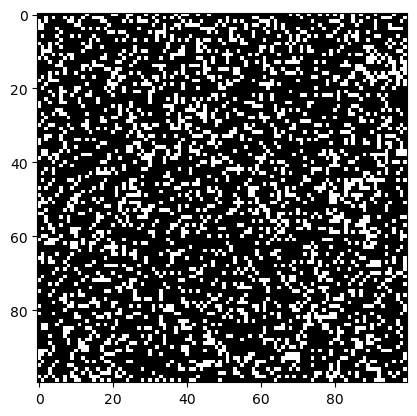

In [28]:
# Simulate time evolution of a 2D Ising model with nn and nnn interactions.
# Start with a random state with 75% spins down.
J_dict = {
        'top': 1.0,
        'bottom': 0.5,
        'left': 1.2,
        'right': 0.8
    }
IsingNR = IsingNonReciprocal(T=0.1, J=J_dict, H=0.1)
np.random.seed(1)

frames = []
dim = 100
lattice2d = np.random.choice([-1, 1], size=(dim, dim), p=[0.75, 0.25])
frames.append(lattice2d)
fig = plt.figure()
img = plt.imshow(lattice2d, cmap="gray")

iterations = 200
prev = lattice2d
for i in range(iterations):
    current = IsingNR.update_spins(prev)
    frames.append(current)
    if np.array_equal(current, prev):
        break
    prev = current
print("iterations:", i + 1)

# Animate the simulation.
def animate(frame):
    img.set_array(frame)

animation = FuncAnimation(fig, animate, frames=frames, interval=len(frames))
HTML(animation.to_jshtml())

---
# Ising model on Cayley tree

A Cayley tree is a tree in which every vertex/node except the root and leaf nodes have the same number of edges. Cayley trees are classified based on the branching ratio $k$, the number of children per non-leaf node. On an open Cayley tree, it can be shown that the lack of cycles prohibits the system from exhibiting collective behaviors such as phase transitions. In our project, we explore the behavior of the Ising Model on a double Cayley tree. This is a closed Cayley tree formed by connecting two identical open trees at their youngest generation, i.e. leaf nodes.

Unlike the previous 1D and 2D cases, this implementation represents the spin system as a vector and the nearest-neighbor connections (i.e. edges between nodes) as an adjacency matrix. The function below generates the adjacency matrix for a given branching ratio $k$ and height $h$. The characteric symmetry of the double Cayley tree can be seen in the visualization of the adjacency matrix in the cell below.

In [8]:
def double_Cayley_tree(k, h):
    """ 
    Generate a double (closed) Cayley tree by connecting 2 identical open Cayley
    trees at the youngest generation (leaf nodes).

    Args:
        k (int): branching ratio, ie. number of children per non-leaf node
                (number of nearest neighbors is k + 1)
        h (int): height of each open Cayley tree
                (height of the double Cayley tree is 2h)
    
    Returns:
        X_adjacency (2d array): adjacency matrix representing all edges between nodes
    """
    dim = 0
    for g in range(h):
        dim += 2 * (k ** g)
    dim += k ** h
    X_upper = np.zeros((dim, dim))

    # Fill upper triangle.
    node = 0
    # Upper tree
    for g in range(h):  # Generation number
        for _ in range(k ** g):     # Each node within a generation
            for c in range(1, k + 1):
                X_upper[node, (k * node + c)] = 1
            node += 1
    
    # Lower tree
    c = (k - 1) * node + 1
    for g in range(h, 2 * h):
        g_prime = 2 * h - g     # Corresponding generation in upper tree
        for i in range(k ** g_prime):
            X_upper[node, (node + c)] = 1

            if i % k != (k - 1):
                c -= 1
            node += 1
    
    # Fill lower triangle to create symmetric matrix.
    X_adjacency = X_upper + X_upper.T - np.diag(np.diag(X_upper))

    return X_adjacency

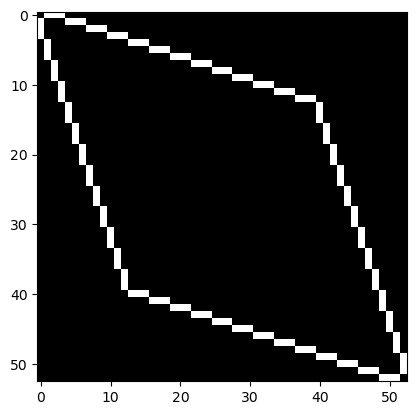

In [9]:
X3 = double_Cayley_tree(3, 3)

# for i, row in enumerate(X3):
#     for j, el in enumerate(row):
#         if j > i and el == 1:
#             print(i, j)

plt.imshow(X3, cmap='grey')
plt.show()

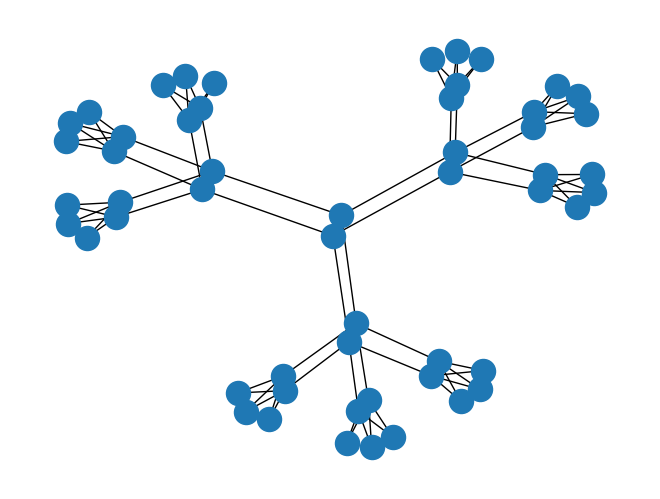

In [13]:
# simple graph representation of a Cayley Graph

G = nx.from_numpy_array(X3)
nx.draw(G)

For the IsingCayley class below, the nn_alignment method is implemented simply through matrix multiplication of the spin system vector with the adjacency matrix. Because representing the Cayley tree requires two objects - a vector of spins and an adjacency matrix of nearest-neighbor connections - the update_spins and net_energy methods are also modified to take in both objects as parameters. Although here we only analyze double Cayley trees, the class IsingCayley can be used for any type of Cayley tree or a more general graph of any geometry.

In [15]:
class IsingCayley(MetropolisIsing):
    """ 
    Metropolis MC implementation of Ising model on a Cayley graph.
    """
    def nn_alignment(self, v_spins, X_neighbors):
        """ 
        Sum the spin values of the nearest neighbors (nn) for each spin in
        the Cayley graph. This represents the net alignment of the nn spins. 
        Args:
            v_spins (1d array): current state of the spin system
            X_neighbors (2d array): adjacency matrix denoting all edges between spins

        Returns:
            v_nn (1d array): sum of nn spin values
        """
        v_nn = np.ones_like(v_spins)
        v_nn = X_neighbors @ v_nn
        return v_nn
    
    def update_spins(self, v_spins, X_neighbors):
        """ 
        Update spins in the lattice using metropolis algorithm.
        Args:
            v_spins (1d array): current state of the spin system
            X_neighbors (2d array): adjacency matrix denoting all edges between spins
        
        Returns:
            X_result (2d array): updated state of the spin system
        """
        # Calculate change in energy required to flip each spin.
        X_nn = self.nn_alignment(v_spins, X_neighbors)
        X_Ei = - self.J * v_spins * X_nn - self.H * v_spins
        X_Ef = - X_Ei
        X_deltaE = X_Ef - X_Ei

        X_result = v_spins.copy()
        X_flip = - v_spins

        # If deltaE < 0, accept the spin flip.
        X_result[X_deltaE < 0] = X_flip[X_deltaE < 0]

        # If deltaE > 0, accept the spin flip with probability
        # given by Boltzmann factor.
        X_prob = np.random.rand(*v_spins.shape)
        X_prob_c = np.exp(- self.beta * X_deltaE)
        X_result[(X_deltaE > 0) & (X_prob < X_prob_c)] = X_flip[
            (X_deltaE > 0) & (X_prob < X_prob_c)]

        return X_result
    
    def net_energy(self, v_spins, X_neighbors):
        """ 
        Calculate net energy of the spin lattice. This is the sum of all energies
        due to nn interactions and the external magnetic field.
        Args:
            v_spins (2d array): current state of the spin system
            X_neighbors (2d array): adjacency matrix denoting all edges between spins
        
        Returns:
            (float): net energy
        """
        X_nn = self.nn_alignment(v_spins, X_neighbors)
        X_E = -self.J * v_spins * X_nn - self.H * v_spins
        return np.sum(X_E) / 2



k: 3 , h: 2
dimensions: 17


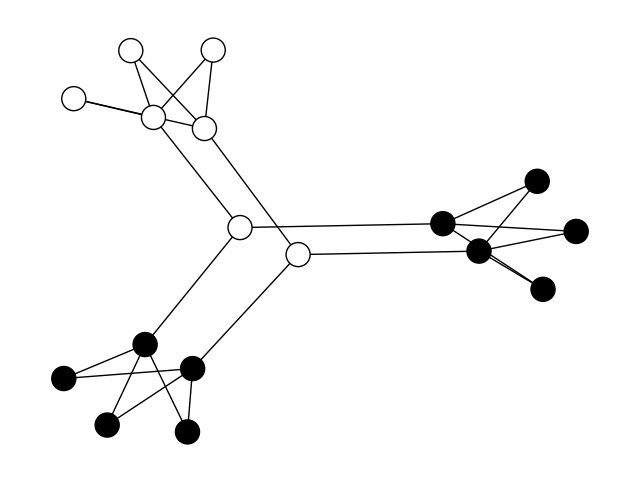

In [31]:
# 2D graph visualization of Cayley Ising model
Ising_all_nn = IsingCayley(T=30, J=1, H=0.0)
np.random.seed(0)

k = 3   # Branching ratio (number of neighbors - 1)
h = 2   # Height of open tree (1/2 height of full double tree)
dim = 0
for g in range(h):
    dim += 2 * (k ** g)
dim += k ** h
print("k:", k, ", h:", h)
print("dimensions:", dim)

v_spins = np.random.choice([-1, 1], size=dim)
X_adjacency = double_Cayley_tree(k, h)

# function to assign color of each node
def get_node_colors(spins):
    return ["black" if spin == 1 else "white" for spin in spins]

# create the graph using networkx package
G = nx.from_numpy_array(X_adjacency)
positions = nx.spring_layout(G)
fig, ax = plt.subplots(figsize=(8,6))

node_colors = get_node_colors(v_spins)
nodes = nx.draw_networkx_nodes(G, pos=positions, node_color=node_colors, ax=ax, node_size=300, edgecolors="black", linewidths=1)
edges = nx.draw_networkx_edges(G, pos=positions, ax=ax)
ax.axis("off")

# update spins over iteration amount
iterations = 200
frames = [v_spins.copy()]
prev = v_spins.copy()
for i in range(iterations):
    current = Ising_all_nn.update_spins(prev, X_adjacency)
    frames.append(current.copy())
    if np.array_equal(current, prev):  # Stop if spins stabilize.
        break
    prev = current

def update(frame):
    current_spins = frames[frame]
    colors = get_node_colors(current_spins)
    nodes.set_facecolor(colors)
    nodes.set_edgecolor("black")
    return nodes,

# Create the animation.
animation = FuncAnimation(fig, update, frames=len(frames), interval=200, blit=True)

# Display the animation.
HTML(animation.to_jshtml())
# animation.save("Cayley Graph Animation.gif")

The cell below simulates the time evolution of the spins on a double Cayley tree at different temperatures and with no external magnetic field. As the temperature increases, the spins tend to randomize.

k: 2 , h: 10
number of spins: 3070
No external field (H = 0).


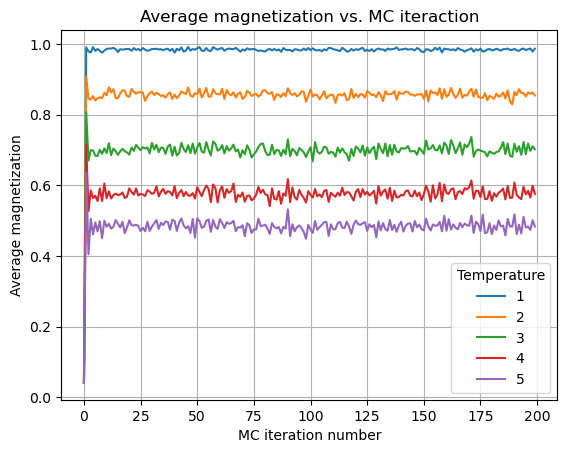

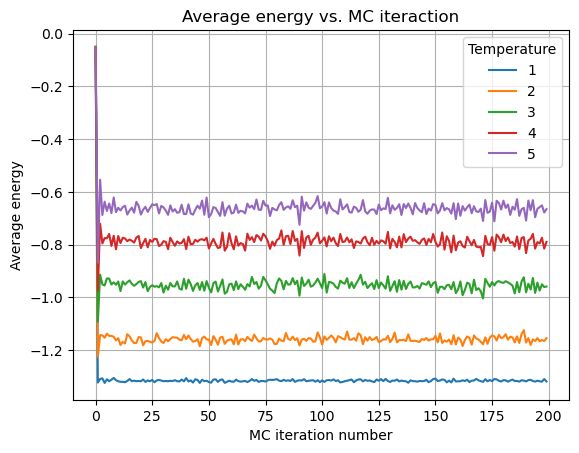

In [30]:
# Plot average values vs MC iteration for various temperatures, with 0 external field.
# Start with a random state with 75% spins down.
temps = np.arange(1, 6, 1)
total_iter = 200
all_iter = []
all_mag, all_energies = [], []

k = 2   # Branching ratio (number of neighbors - 1)
h = 10   # Height of open tree (1/2 height of full double tree)
dim = 0
for g in range(h):
    dim += 2 * (k ** g)
dim += k ** h
print("k:", k, ", h:", h)
print("number of spins:", dim)

v_spins = np.random.choice([-1, 1], size=dim)
v_spins_reshape = v_spins.reshape(1, -1)
X_adjacency = double_Cayley_tree(k, h)

# X_adjacency = np.ones((dim, dim))
# np.fill_diagonal(X_adjacency, 0)

for temp in temps:
    Ising_Cayley = IsingCayley(T=temp, J=1, H=0.0)
    np.random.seed(0)
    iteration = np.arange(0, total_iter)
    avg_mag, avg_energy = [], []

    prev = v_spins
    for i in range(total_iter):
        current = Ising_Cayley.update_spins(prev, X_adjacency)
        avg_mag.append(Ising_Cayley.net_magnetization(prev) / (dim))
        avg_energy.append(Ising_Cayley.net_energy(prev, X_adjacency) / (dim))
        prev = current

    all_iter.append(iteration)
    all_mag.append(avg_mag)
    all_energies.append(avg_energy)

print("No external field (H = 0).")
plt.figure(0)
for i in range(len(all_iter)):
    temp = temps[i]
    plt.plot(all_iter[i], all_mag[i], label=str(temp))

plt.xlabel('MC iteration number')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. MC iteraction')
plt.grid()
plt.legend(title="Temperature")
plt.show()

plt.figure(1)
for i in range(len(all_iter)):
    temp = temps[i]
    plt.plot(all_iter[i], all_energies[i], label=str(temp))

plt.xlabel('MC iteration number')
plt.ylabel('Average energy')
plt.title('Average energy vs. MC iteraction')
plt.grid()
plt.legend(title="Temperature")
plt.show()

The cells below plot the functions of average magnetization, energy, and heat capacity for different values of the external field strength $H$. The plots are smooth functions of temperature, indicating the absence of a phase transition. It can be inferred that the presence of minimal cycles significantly reduces the ability of the system to exhibit collective behavior, even if each spin has a large number of neighbors (large branching ratio $k$). The average heat capacity plots exhibit many jumps due to statistical fluctuations.

k: 2 , h: 10
number of spins: 3070


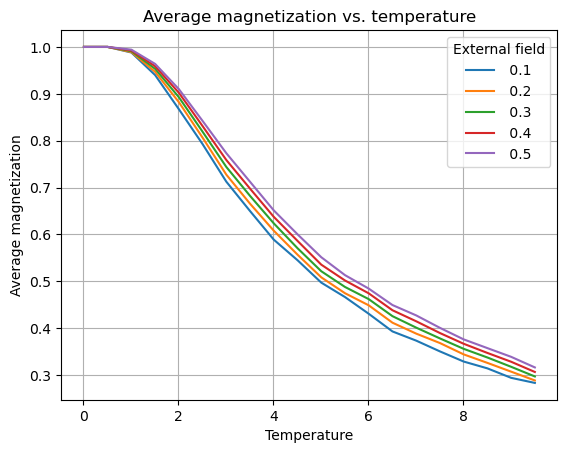

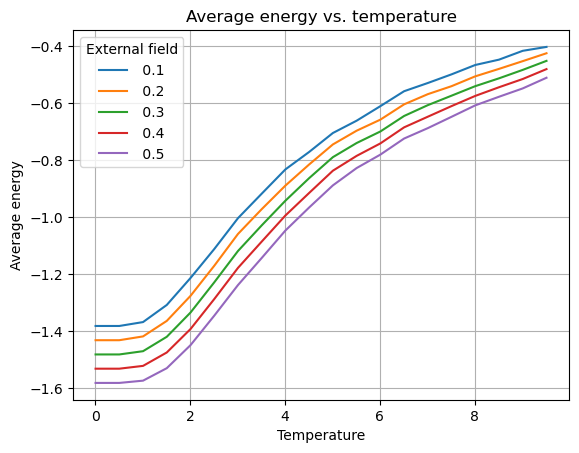

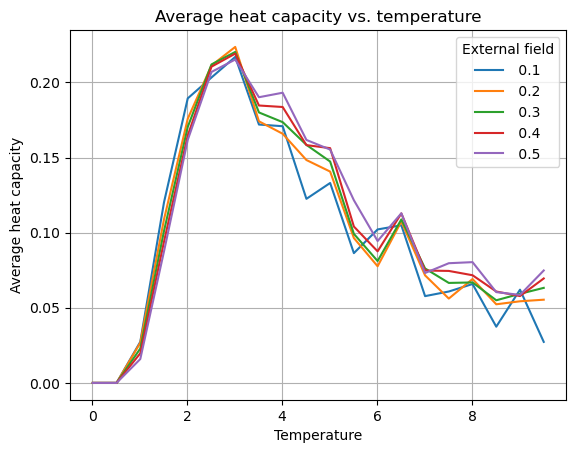

In [131]:
# Plot equilibrium average values as a function of temperature for various 
# external field strengths.
# Start with random state with 75% spins down.
ext_field = np.arange(0.1, 0.6, 0.1)
delta_temp = 0.5
temps = np.arange(0.01, 10., delta_temp)
total_iter = 100
trials = 20
l_all_mag, l_all_energy, l_all_heat_cap = [], [], []

k = 2   # Branching ratio (number of neighbors - 1)
h = 10   # Height of open tree (1/2 height of full double tree)
dim = 0
for g in range(h):
    dim += 2 * (k ** g)
dim += k ** h
print("k:", k, ", h:", h)
print("number of spins:", dim)

for field_val in ext_field:
    np.random.seed(0)
    v_spins = np.random.choice([-1, 1], size=dim, p=[0.75, 0.25])
    l_mag, l_energy, l_heat_cap = [], [], []

    for temp in temps:
        Ising_Cayley = IsingCayley(T=temp, J=1, H=field_val)
        X_adjacency = double_Cayley_tree(k, h)
        prev = v_spins
        trial_energy, trial_mag = [], []
        for t in range(trials):     # Multiple trials to average out statistical fluctuations.
            for i in range(total_iter):
                current = Ising_Cayley.update_spins(prev, X_adjacency)
                if np.array_equal(current, prev):
                    break
                prev = current
            trial_energy.append(Ising_Cayley.net_energy(prev, X_adjacency) / dim)
            trial_mag.append(Ising_Cayley.net_magnetization(prev) / dim)
        
        avg_mag = sum(trial_mag) / trials
        avg_energy = sum(trial_energy) / trials
        if not l_energy:
            heat_cap = 0
        else:
            heat_cap = (avg_energy - l_energy[-1]) / delta_temp
        l_mag.append(avg_mag)
        l_energy.append(avg_energy)
        l_heat_cap.append(heat_cap)
        
    l_all_mag.append(l_mag)
    l_all_energy.append(l_energy)
    l_all_heat_cap.append(l_heat_cap)

plt.figure(0)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_mag[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

plt.figure(1)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_energy[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average energy')
plt.title('Average energy vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

plt.figure(2)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_heat_cap[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average heat capacity')
plt.title('Average heat capacity vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

k: 5 , h: 4
number of spins: 937


C:\Users\ktcy2\AppData\Local\Temp\ipykernel_1704\3417388861.py:45: RuntimeWarning: overflow encountered in exp
  X_prob_c = np.exp(- self.beta * X_deltaE)


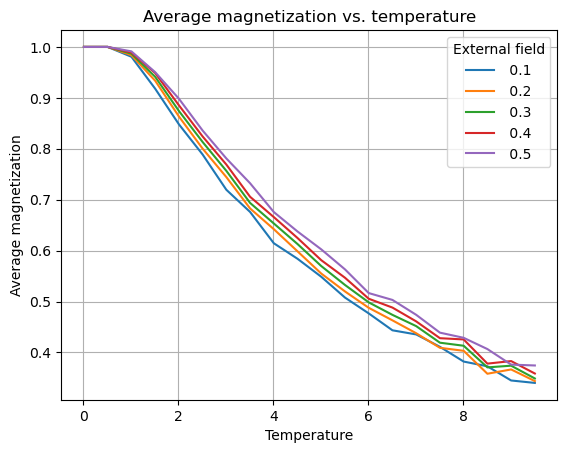

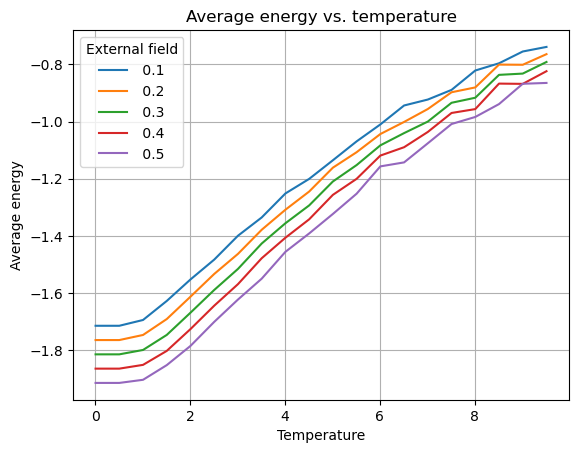

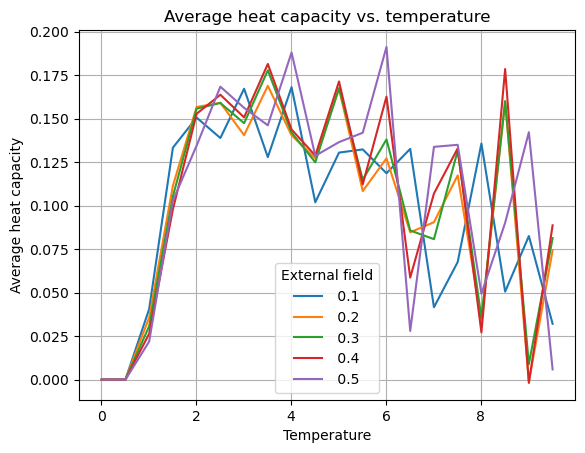

In [38]:
# Plot equilibrium average values as a function of temperature for various 
# external field strengths.
# Start with random state with 75% spins down.
ext_field = np.arange(0.1, 0.6, 0.1)
delta_temp = 0.5
temps = np.arange(0.01, 10., delta_temp)
total_iter = 100
trials = 20
l_all_mag, l_all_energy, l_all_heat_cap = [], [], []

k = 5   # Branching ratio (number of neighbors - 1)
h = 4   # Height of open tree (1/2 height of full double tree)
dim = 0
for g in range(h):
    dim += 2 * (k ** g)
dim += k ** h
print("k:", k, ", h:", h)
print("number of spins:", dim)

for field_val in ext_field:
    np.random.seed(0)
    v_spins = np.random.choice([-1, 1], size=dim)
    v_spins_reshape = v_spins.reshape(1, -1)
    # X_adjacency = np.ones((dim, dim))
    # np.fill_diagonal(X_adjacency, 0)
    X_adjacency = double_Cayley_tree(k, h)
    l_mag, l_energy, l_heat_cap = [], [], []

    for temp in temps:
        Ising_Cayley = IsingCayley(T=temp, J=1, H=field_val)
        prev = v_spins
        trial_energy, trial_mag = [], []
        for t in range(trials):     # Multiple trials to average out statistical fluctuations.
            for i in range(total_iter):
                current = Ising_Cayley.update_spins(prev, X_adjacency)
                if np.array_equal(current, prev):
                    break
                prev = current
            trial_energy.append(Ising_Cayley.net_energy(current, X_adjacency) / dim)
            trial_mag.append(Ising_Cayley.net_magnetization(current) / dim)
        
        avg_mag = sum(trial_mag) / trials
        avg_energy = sum(trial_energy) / trials
        if not l_energy:
            heat_cap = 0
        else:
            heat_cap = (avg_energy - l_energy[-1]) / delta_temp
        l_mag.append(avg_mag)
        l_energy.append(avg_energy)
        l_heat_cap.append(heat_cap)
        
    l_all_mag.append(l_mag)
    l_all_energy.append(l_energy)
    l_all_heat_cap.append(l_heat_cap)

plt.figure(0)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_mag[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average magnetization')
plt.title('Average magnetization vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

plt.figure(1)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_energy[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average energy')
plt.title('Average energy vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()

plt.figure(2)
for i, field_val in enumerate(ext_field):
    plt.plot(temps, l_all_heat_cap[i], label=f"{field_val: .1f}")
plt.xlabel('Temperature')
plt.ylabel('Average heat capacity')
plt.title('Average heat capacity vs. temperature')
plt.grid()
plt.legend(title="External field")
plt.show()